In [1]:
using DifferentialEquations
using Plots
using Makie
using Dierckx
gr(fmt = :png)

Plots.GRBackend()

In [26]:
function diff_eq(du, u, p, t)
    a = p[1]
    w = p[2]
    t0 = p[3]
    s = p[4]
    du[1] = -u[2] + a*cos(w*t)*u[2]*e^(-(t-t0)^2/(2*s^2))
    du[2] = u[1]
end

diff_eq (generic function with 1 method)

  likely near C:\Users\Vojta\.julia\packages\IJulia\DL02A\src\kernel.jl:41
  likely near C:\Users\Vojta\.julia\packages\IJulia\DL02A\src\kernel.jl:41
  likely near C:\Users\Vojta\.julia\packages\IJulia\DL02A\src\kernel.jl:41


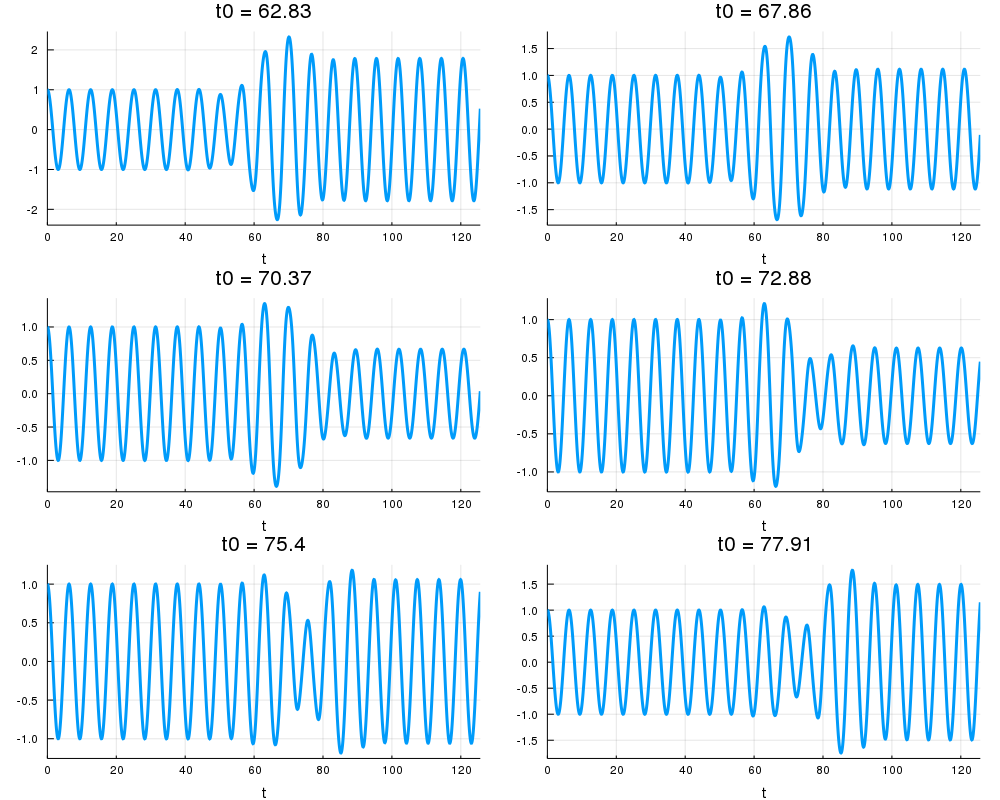

In [27]:
u0 = [0.0;1.0]
tspan = (0.0,2*pi*20.0)
p0 = [0.5, 1.7, 2*pi*0.4, tspan[2]/15]
p = deepcopy(p0)
p[3] = tspan[2]/2
prob = ODEProblem(diff_eq,u0,tspan,p)
sol = solve(prob)
p1 = Plots.plot(sol, vars = (0,2), title = "t0 = $(round(p[3], digits = 2))")

p[3] = p0[3]*2 + tspan[2]/2
prob = ODEProblem(diff_eq,u0,tspan,p)
sol = solve(prob)
p2 = Plots.plot(sol, vars = (0,2), title = "t0 = $(round(p[3], digits = 2))")

p[3] = p0[3]*3 + tspan[2]/2
prob = ODEProblem(diff_eq,u0,tspan,p)
sol = solve(prob)
p3 = Plots.plot(sol, vars = (0,2), title = "t0 = $(round(p[3], digits = 2))")

p[3] = p0[3]*4 + tspan[2]/2
prob = ODEProblem(diff_eq,u0,tspan,p)
sol = solve(prob)
p4 = Plots.plot(sol, vars = (0,2), title = "t0 = $(round(p[3], digits = 2))")

p[3] = p0[3]*5 + tspan[2]/2
prob = ODEProblem(diff_eq,u0,tspan,p)
sol = solve(prob)
p5 = Plots.plot(sol, vars = (0,2), title = "t0 = $(round(p[3], digits = 2))")

p[3] = p0[3]*6 + tspan[2]/2
prob = ODEProblem(diff_eq,u0,tspan,p)
sol = solve(prob)
p6 = Plots.plot(sol, vars = (0,2), title = "t0 = $(round(p[3], digits = 2))")

Plots.plot(p1, p2, p3, p4, p5, p6, layout = @layout([a b; c d; e f]), legend = :none, size = (1000,800))

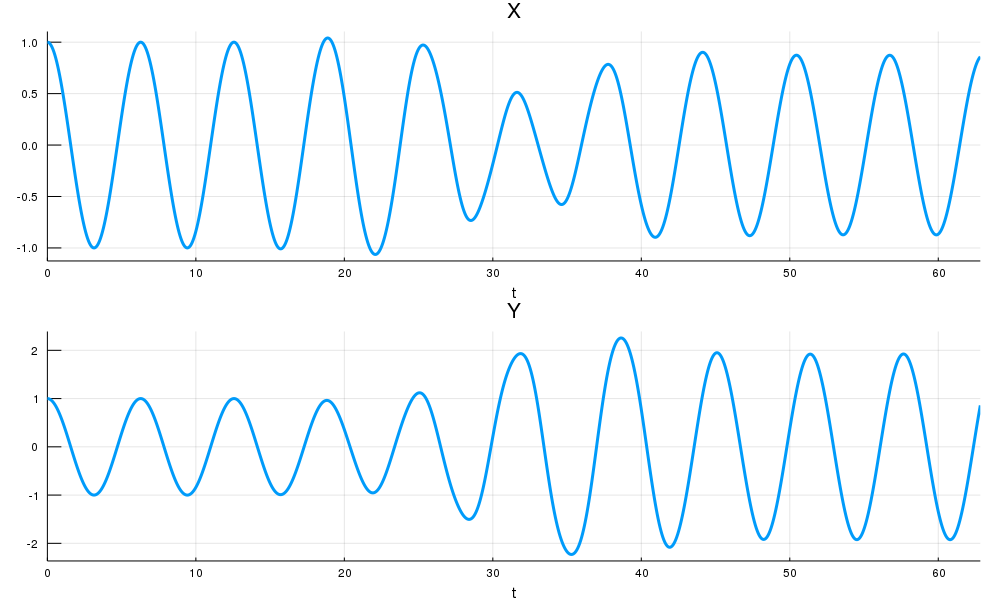

In [40]:
u0 = [0.0;1.0]
tspan = (0.0,2*pi*10.0)
p0 = [0.5, 1.7, 2*pi*0.4, tspan[2]/10]
p = deepcopy(p0)
p[3] = tspan[2]/2
prob = ODEProblem(diff_eq,u0,tspan,p)
sol1 = solve(prob)
p1 = Plots.plot(sol1, vars = (0,2), title = "X")



p[1] = -p0[1]
prob = ODEProblem(diff_eq,u0,tspan,p)
sol2 = solve(prob)
p2 = Plots.plot(sol2, vars = (0,2), title = "Y")

Plots.plot(p1, p2, layout = (2, 1), legend = :none, size = (1000, 600))

In [41]:
sol1_arr = [sol1[2, i] for i = 1:size(sol1,2)]
sol1_t = [sol1.t[i] for i = 1:size(sol1,2)]
spl1 = Spline1D(sol1_t, sol1_arr)

Spline1D(knots=[0.0,0.010989 … 61.9328,62.8319] (83 elements), k=3, extrapolation="nearest", residual=0.0)

In [42]:
sol2_arr = [sol2[2, i] for i = 1:size(sol2,2)]
sol2_t = [sol2.t[i] for i = 1:size(sol2,2)]
spl2 = Spline1D(sol2_t, sol2_arr)

Spline1D(knots=[0.0,0.010989 … 61.8094,62.8319] (81 elements), k=3, extrapolation="nearest", residual=0.0)

In [43]:
scene = Scene(resolution = (1000, 1000))

ff(t,s) = (spl1(t)*cos(s), spl2(t)*sin(s))
time = Node(0.0)
limits = FRect(-2.5, -2.5, 5, 5)
p1 = lines!(scene, lift(t-> ff.(t, range(0, stop = 2pi, length = 300)), time), color = :blue, linewidth = 3, limits = limits)
N = 1000
record(scene, "D:\\Documents\\Diplomka\\Animations\\string_grav_wave_bulk.gif", range(tspan[1], stop = tspan[2], length = N)) do i
    push!(time, i)
    sleep(1/120)
end

"D:\\Documents\\Diplomka\\Animations\\string_grav_wave_bulk.gif"